In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!pwd

/content


In [ ]:
import os
scale_filenames = os.listdir("/content/drive/MyDrive/Forgery detection separate /scale")
tamp_filenames = os.listdir("/content/drive/MyDrive/Forgery detection separate /tamp")

filenames = scale_filenames + tamp_filenames

In [ ]:
real_count = 0
tamp_count = 0

for i in filenames:
  if 'tamp' in i:
    tamp_count+=1
  if 'scale' in i:
    real_count+=1

print("Number of real images = ", real_count)
print("Number of tampered images = ", tamp_count)

Number of real images =  1300
Number of tampered images =  700


In [ ]:
import pandas as pd

# 0 label for real images
scale_df = pd.DataFrame({'filename': scale_filenames, 'label': 1})

# 1 label for tampered images
tamp_df = pd.DataFrame({'filename': tamp_filenames, 'label': 0})

data = pd.concat([scale_df, tamp_df], ignore_index=True)
data = data.sample(frac=1).reset_index(drop=True)
data

,filename,label
0,DSC_1568tamp6.jpg,0
1,DSC_1182_scale.jpg,1
2,DSC_0968_scale.jpg,1
3,DSC_0162_01_scale.jpg,1
4,DSCF0201tamp7.jpg,0
...,...,...
1996,P1000231tamp6.jpg,0
1997,DSC_0011_01_scale.jpg,1
1998,DSC_0150_scale.jpg,1
1999,DSC01176tamp3.jpg,0


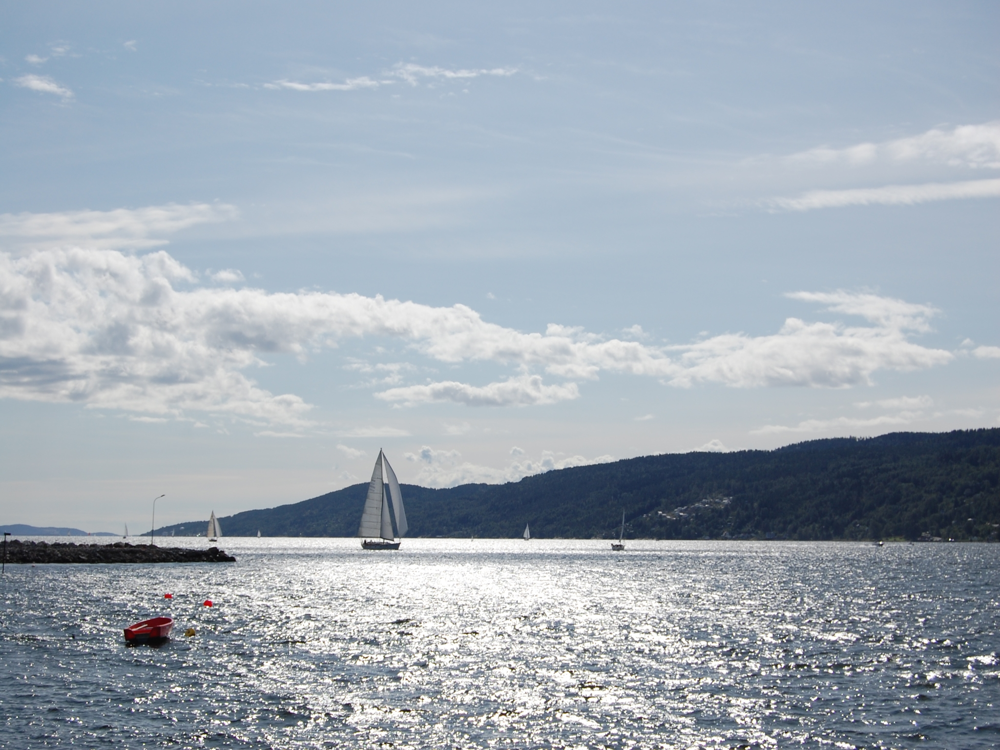

In [ ]:
# Displaying image
from IPython.display import Image

image_path = '/content/drive/MyDrive/Forgery detection separate /scale/DSC_0156_scale.jpg'
Image(filename=image_path)

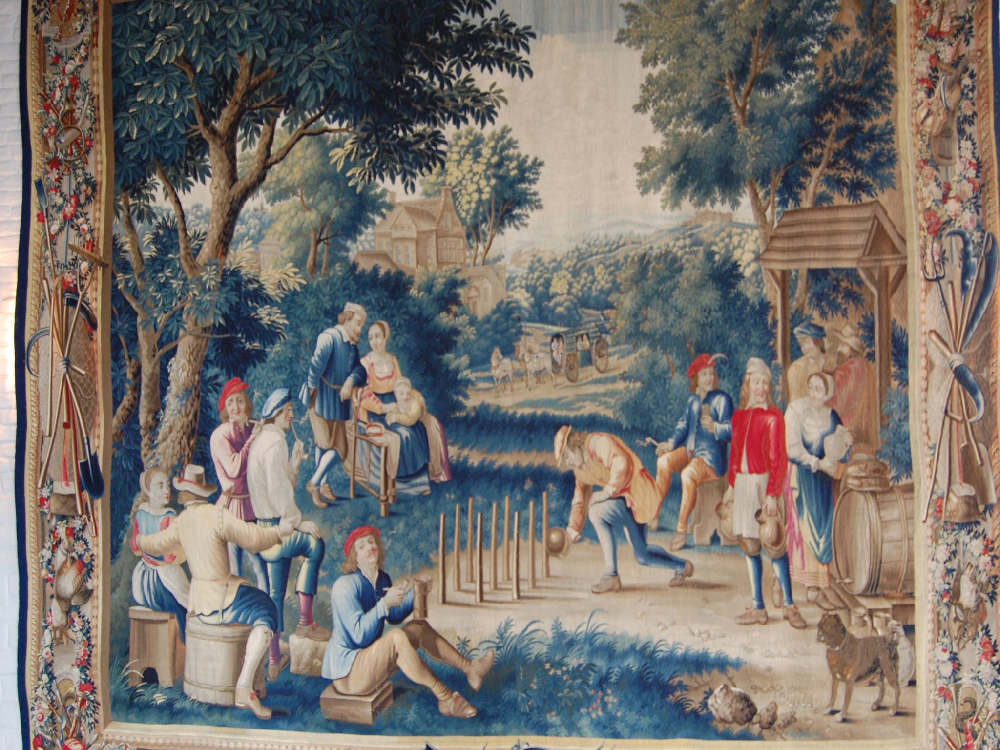

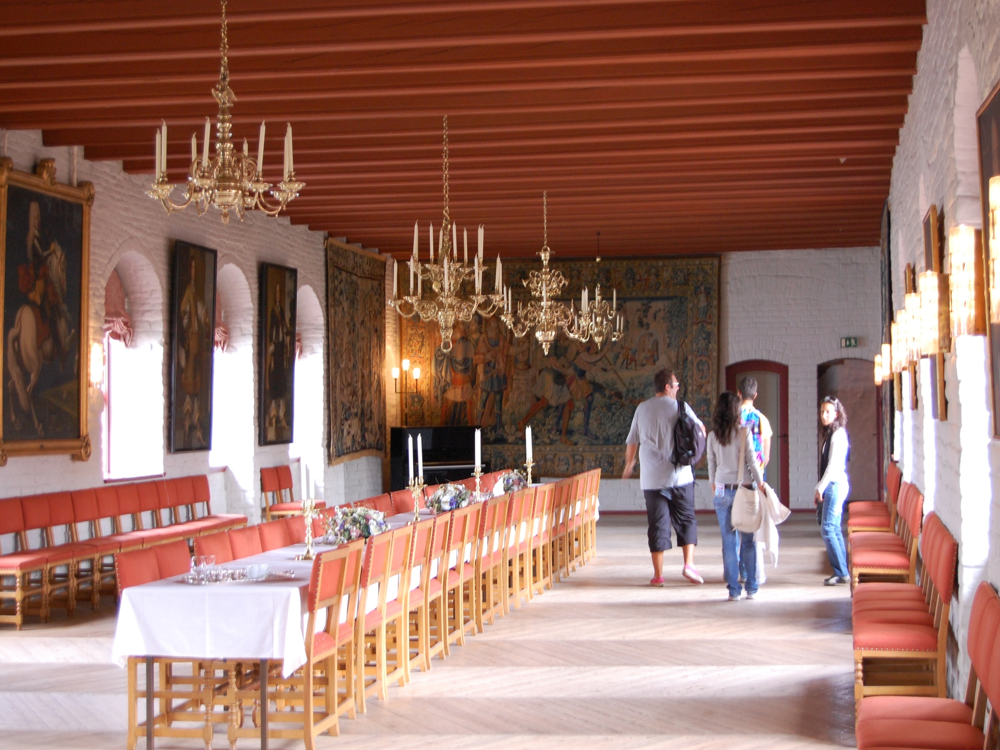

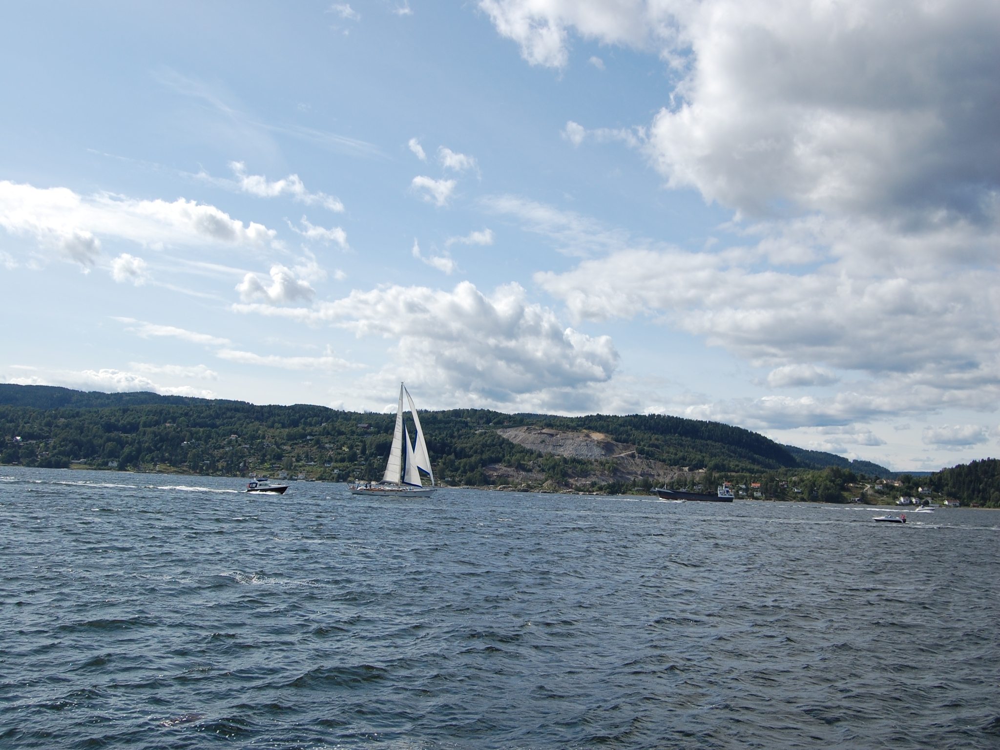

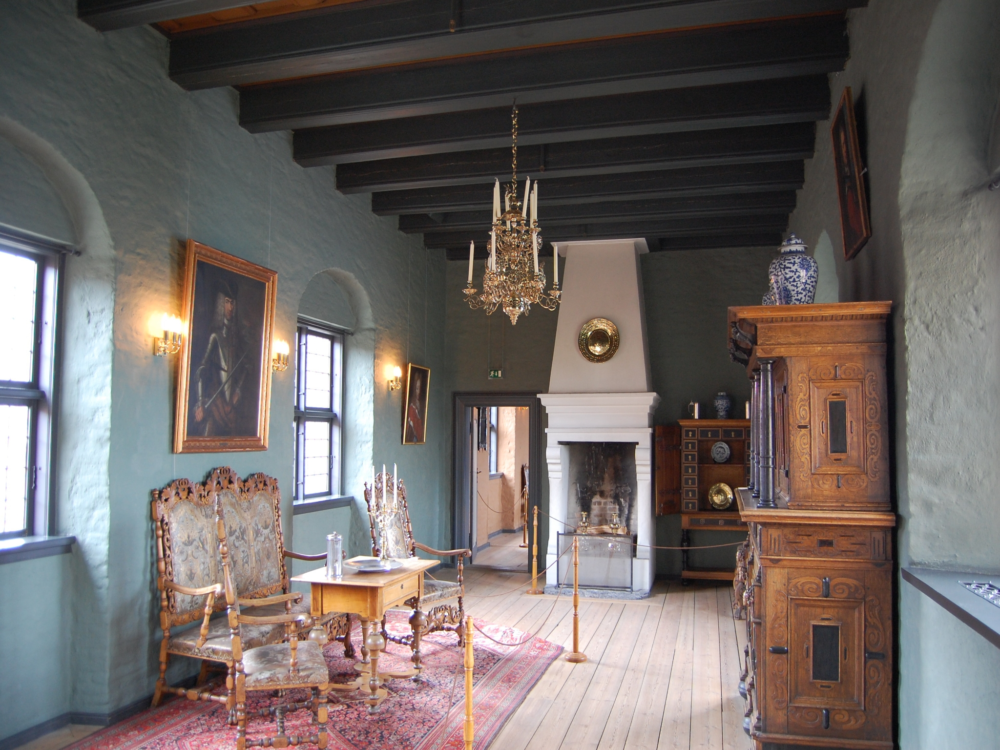

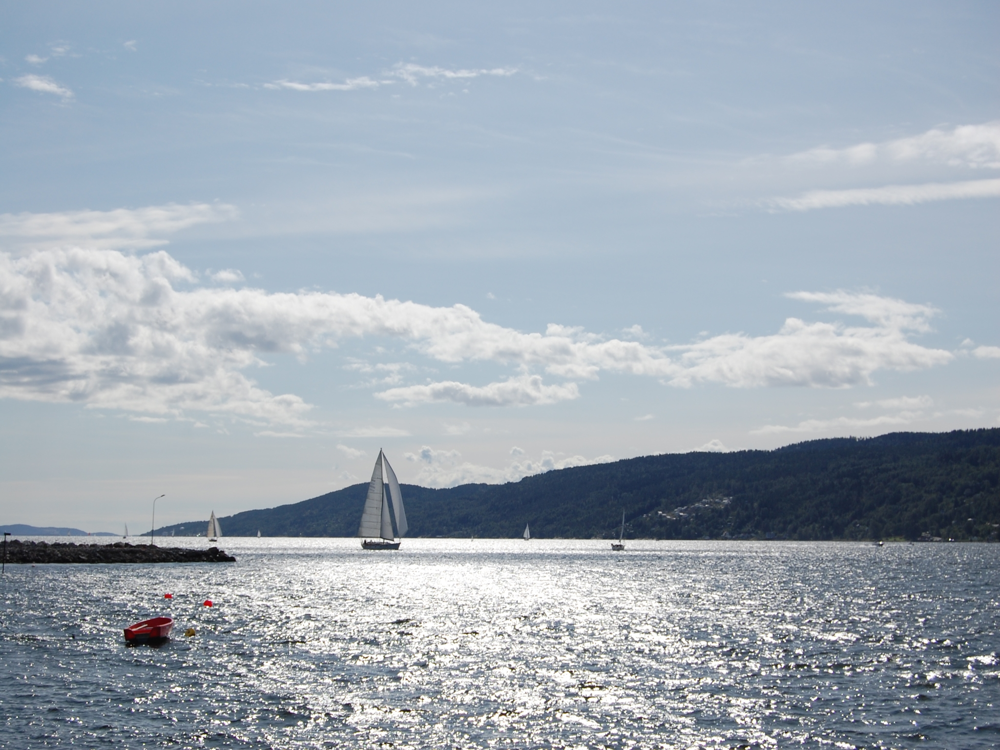

In [ ]:
# Displaying 5 images using loop

scale_folder = '/content/drive/MyDrive/Forgery detection separate /scale'
tamp_folder = '/content/drive/MyDrive/Forgery detection separate /tamp'

for filename in filenames[:5]:
  if 'scale' in filename:
    image_path = os.path.join(scale_folder, filename)
  else:
    image_path = os.path.join(tamp_folder, filename)
  display(Image(filename=image_path))

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

img = mpimg.imread(image_path)
type(img), img.shape

(numpy.ndarray, (1536, 2048, 3))

In [ ]:
# Image is converted to numpy array
print(img/255.)

[[[0.55294118 0.64705882 0.74117647]
  [0.55294118 0.64705882 0.74117647]
  [0.54901961 0.65098039 0.74117647]
  ...
  [0.56862745 0.64705882 0.74117647]
  [0.56470588 0.64313725 0.7372549 ]
  [0.56078431 0.63921569 0.73333333]]

 [[0.55294118 0.64705882 0.74117647]
  [0.54901961 0.64313725 0.7372549 ]
  [0.5372549  0.63921569 0.72941176]
  ...
  [0.56470588 0.64313725 0.7372549 ]
  [0.56470588 0.64313725 0.7372549 ]
  [0.56470588 0.64313725 0.7372549 ]]

 [[0.54901961 0.64313725 0.7372549 ]
  [0.54901961 0.64313725 0.7372549 ]
  [0.54901961 0.64313725 0.7372549 ]
  ...
  [0.56470588 0.63529412 0.72941176]
  [0.55686275 0.63529412 0.72941176]
  [0.56078431 0.63921569 0.73333333]]

 ...

 [[0.35294118 0.4        0.49411765]
  [0.34509804 0.39215686 0.48627451]
  [0.35294118 0.39215686 0.49019608]
  ...
  [0.28235294 0.33333333 0.39607843]
  [0.2745098  0.3254902  0.38823529]
  [0.27058824 0.32156863 0.38431373]]

 [[0.30980392 0.35686275 0.44313725]
  [0.30196078 0.34901961 0.43529412]


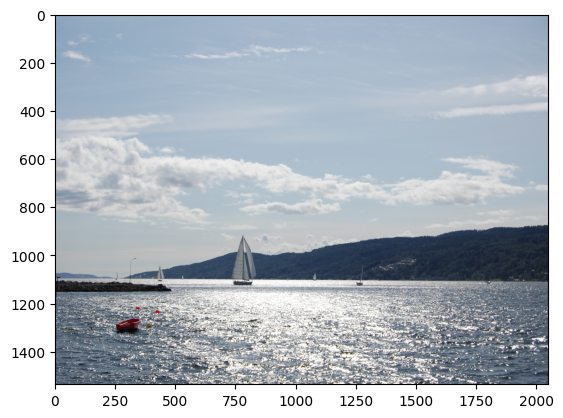

In [ ]:
# Displaying the image from numpy array
img_plot = plt.imshow(img)
plt.show()

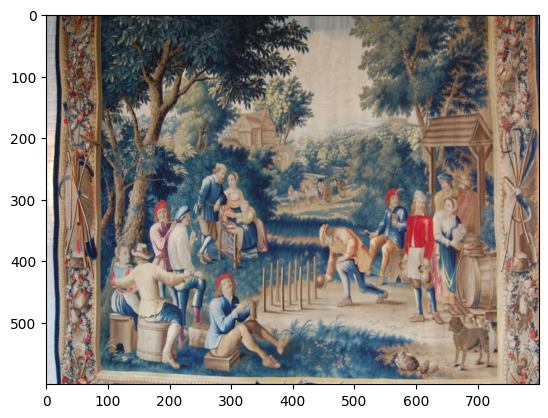

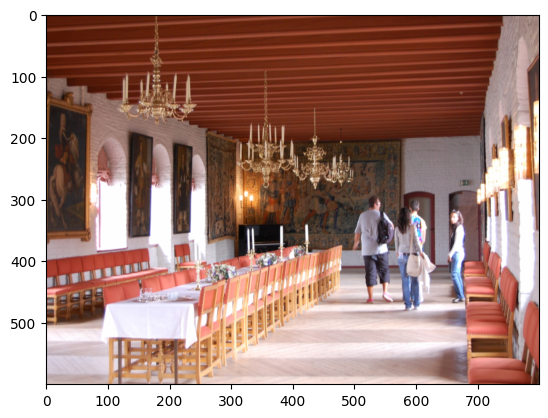

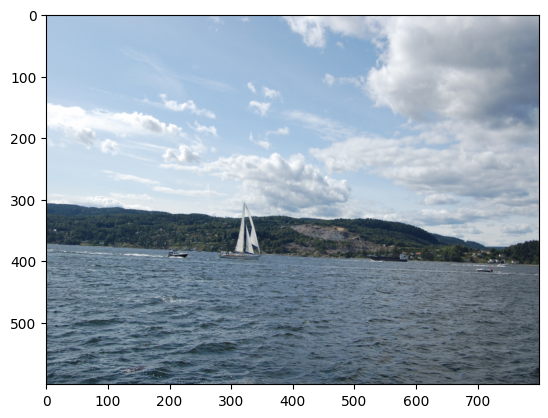

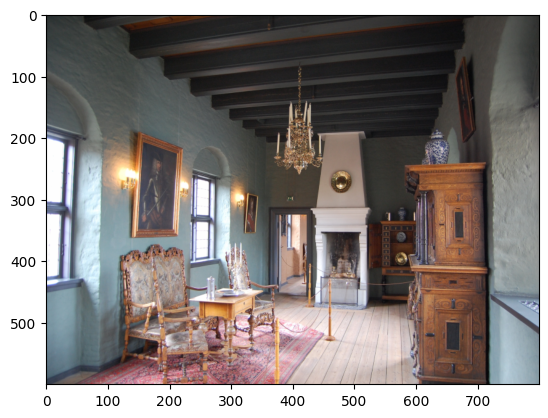

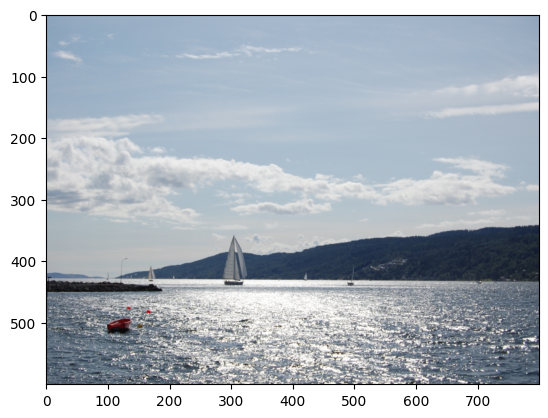

In [ ]:
from skimage.transform import resize

for filename in filenames[:5]:
  if 'scale' in filename:
    image_path = os.path.join(scale_folder, filename)
  else:
    image_path = os.path.join(tamp_folder, filename)

  # Resize the image to 600x800
  img = plt.imread(image_path)
  img_resized = resize(img, (600, 800))

  plt.imshow(img_resized)
  plt.show()

Resizing all the images and creating a directory for resized images


In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

In [ ]:
os.mkdir('/content/resized_image')

In [ ]:
import os
from PIL import Image

# Folders containing the images
scale_folder = '/content/drive/MyDrive/Forgery detection separate /scale/'
tamp_folder = '/content/drive/MyDrive/Forgery detection separate /tamp/'
resized_folder = '/content/resized_image/'

# Function to resize images in a folder
def resize_images(folder_path):
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.jpg', '.jpeg')):
            img_path = os.path.join(folder_path, filename)
            img = Image.open(img_path)
            img = img.resize((224, 224))
            img = img.convert('RGB')

            new_img_path = os.path.join(resized_folder, filename)
            img.save(new_img_path)
            img.close()

# Resize images in scale folder
resize_images(scale_folder)

# Resize images in tamp folder
resize_images(tamp_folder)

In [ ]:
# Count the number of image files
folder_path = '/content/resized_image'

files = os.listdir(folder_path)

image_extensions = ['.jpg']
image_count = sum(1 for file in files if os.path.splitext(file)[1].lower() in image_extensions)

print("Number of images in the folder:", image_count)

Number of images in the folder: 2000


In [ ]:
# Creating a for loop to assign labels
filenames = os.listdir('/content/resized_image/')


labels = []

for i in range(2000):

  file_name = filenames[i]

  if 'scale' in file_name:
    labels.append(1)

  if 'tamp' in file_name:
    labels.append(0)

In [ ]:
print(filenames[0:5])
print(len(filenames))

['P6300099tamp14.jpg', 'DSC_0258tamp4.jpg', 'P4120010tamp3.jpg', 'DSC_0264tamp4.jpg', '00005_scale.jpg']
2000


In [ ]:
print(labels[0:5])
print(len(labels))

[0, 0, 0, 0, 1]
2000


Converting all the resized images to numpy arrays

In [ ]:
import cv2
import glob

In [ ]:
image_directory = '/content/resized_image/'
image_extension = ['jpg']

files = []

[files.extend(glob.glob(image_directory + '*.' + e)) for e in image_extension]

images_dataset = np.asarray([cv2.imread(file) for file in files])

In [ ]:
print(images_dataset)

[[[[254 253 255]
   [254 253 255]
   [254 253 255]
   ...
   [255 253 255]
   [246 242 247]
   [255 253 255]]

  [[254 253 255]
   [254 253 255]
   [254 253 255]
   ...
   [255 253 255]
   [251 247 252]
   [255 253 255]]

  [[254 253 255]
   [254 253 255]
   [254 253 255]
   ...
   [251 250 252]
   [246 245 247]
   [255 254 255]]

  ...

  [[135 131 130]
   [ 79  74  71]
   [ 33  24  20]
   ...
   [107 107  95]
   [106 106  94]
   [106 106  94]]

  [[174 171 167]
   [ 82  77  74]
   [ 36  27  23]
   ...
   [135 138 122]
   [137 138 122]
   [136 137 121]]

  [[158 155 151]
   [ 62  58  53]
   [ 40  31  27]
   ...
   [144 148 129]
   [143 145 126]
   [137 139 120]]]


 [[[248 254 255]
   [248 254 255]
   [250 254 255]
   ...
   [ 29  44  46]
   [ 12  23  20]
   [  1  11   5]]

  [[240 246 251]
   [243 250 253]
   [250 254 255]
   ...
   [ 16  31  33]
   [  4  15  13]
   [ 14  23  20]]

  [[246 255 255]
   [246 255 255]
   [244 251 254]
   ...
   [  8  25  28]
   [  0  10  10]
   [ 16  27

In [ ]:
type(images_dataset)

numpy.ndarray

In [ ]:
print(images_dataset.shape)

(2000, 224, 224, 3)


In [ ]:
X = images_dataset
Y = np.asarray(labels)

In [ ]:
X[:5], Y[:5]

(array([[[[254, 253, 255],
          [254, 253, 255],
          [254, 253, 255],
          ...,
          [255, 253, 255],
          [246, 242, 247],
          [255, 253, 255]],
 
         [[254, 253, 255],
          [254, 253, 255],
          [254, 253, 255],
          ...,
          [255, 253, 255],
          [251, 247, 252],
          [255, 253, 255]],
 
         [[254, 253, 255],
          [254, 253, 255],
          [254, 253, 255],
          ...,
          [251, 250, 252],
          [246, 245, 247],
          [255, 254, 255]],
 
         ...,
 
         [[135, 131, 130],
          [ 79,  74,  71],
          [ 33,  24,  20],
          ...,
          [107, 107,  95],
          [106, 106,  94],
          [106, 106,  94]],
 
         [[174, 171, 167],
          [ 82,  77,  74],
          [ 36,  27,  23],
          ...,
          [135, 138, 122],
          [137, 138, 122],
          [136, 137, 121]],
 
         [[158, 155, 151],
          [ 62,  58,  53],
          [ 40,  31,  27],
   

Train Test Split

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [ ]:
print(X.shape, X_train.shape, X_test.shape)

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


In [ ]:
print(Y.shape, Y_train.shape, Y_test.shape)

(2000,) (1600,) (400,)


In [ ]:
# scaling the data
X_train_scaled = X_train/255

X_test_scaled = X_test/255

In [ ]:
print(X_train_scaled)

[[[[0.98039216 0.96470588 0.96078431]
   [0.98431373 0.96862745 0.96470588]
   [0.98431373 0.96862745 0.96470588]
   ...
   [0.99607843 1.         0.99215686]
   [0.99215686 0.99607843 0.98823529]
   [0.99215686 0.99607843 0.98823529]]

  [[0.98431373 0.96862745 0.96470588]
   [0.98431373 0.96862745 0.96470588]
   [0.98823529 0.97254902 0.96862745]
   ...
   [0.99607843 1.         0.99215686]
   [0.99607843 1.         0.99215686]
   [0.99607843 1.         0.99215686]]

  [[0.99215686 0.97647059 0.97254902]
   [0.99215686 0.97647059 0.97254902]
   [0.98823529 0.97254902 0.96862745]
   ...
   [0.99607843 1.         0.99215686]
   [0.99215686 0.99607843 0.98823529]
   [0.99215686 0.99607843 0.98823529]]

  ...

  [[0.23137255 0.37254902 0.44313725]
   [0.30588235 0.44313725 0.52156863]
   [0.30980392 0.44313725 0.5372549 ]
   ...
   [0.07843137 0.15294118 0.14117647]
   [0.0627451  0.1372549  0.1254902 ]
   [0.01176471 0.08627451 0.0745098 ]]

  [[0.18431373 0.3254902  0.38823529]
   [0.2

**CNN model**

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Path to the directory containing the resized images
resized_folder = '/content/resized_image/'

# Split the filenames into training and testing sets with a proportion of 80% and 20% respectively
train_filenames, test_filenames = train_test_split(os.listdir(resized_folder), test_size=0.2, random_state=42)

# Create directories for real and fake images inside train and test directories
train_real_dir = '/content/train/real/'
train_fake_dir = '/content/train/fake/'
test_real_dir = '/content/test/real/'
test_fake_dir = '/content/test/fake/'
os.makedirs(train_real_dir, exist_ok=True)
os.makedirs(train_fake_dir, exist_ok=True)
os.makedirs(test_real_dir, exist_ok=True)
os.makedirs(test_fake_dir, exist_ok=True)

# Function to check if filename contains "scale" or "tamp"
def is_real(filename):
    return "scale" in filename.lower() and filename.lower().endswith('.jpg')

def is_fake(filename):
    return "tamp" in filename.lower() and filename.lower().endswith('.jpg')

# Organize images into real and fake directories inside train and test directories
for filename in train_filenames:
    src_path = os.path.join(resized_folder, filename)
    if is_real(filename):
        dst_path = os.path.join(train_real_dir, filename)
        shutil.move(src_path, dst_path)
    elif is_fake(filename):
        dst_path = os.path.join(train_fake_dir, filename)
        shutil.move(src_path, dst_path)

for filename in test_filenames:
    src_path = os.path.join(resized_folder, filename)
    if is_real(filename):
        dst_path = os.path.join(test_real_dir, filename)
        shutil.move(src_path, dst_path)
    elif is_fake(filename):
        dst_path = os.path.join(test_fake_dir, filename)
        shutil.move(src_path, dst_path)

print("Images have been organized into 'real' and 'fake' classes inside the 'train' and 'test' directories.")


Images have been organized into 'real' and 'fake' classes inside the 'train' and 'test' directories.


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the seed
tf.random.set_seed(42)

# Preprocess data (get all of the pixel values between 0 and 1, also called scaling/normalization)
train_datagen = ImageDataGenerator(rescale=1./255)

# Setup the train directory
train_dir = '/content/train/'

# Import data from directory and turn it into batches
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224, 224),  # This should match the input shape of the model
                                               class_mode="binary",
                                               seed=42)

# Print the input shape of the first batch of images
for images, labels in train_data:
    print("Input shape of the batch of images:", images.shape[1:])
    break  # Break after printing the first batch

# Output shape should match the input shape expected by the model


Found 1600 images belonging to 2 classes.
Input shape of the batch of images: (224, 224, 3)


In [ ]:
# Plot the validation and training data separately
def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set the seed
tf.random.set_seed(42)

# Preprocess data (get all of the pixel values between 0 and 1, also called scaling/normalization)
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Setup the train and test directories
train_dir = 'train/'
test_dir = 'test/'

# Import data from directories and turn it into batches
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224, 224),
                                               class_mode="binary",
                                               seed=42)

test_data = test_datagen.flow_from_directory(test_dir,
                                             batch_size=32,
                                             target_size=(224, 224),
                                             class_mode="binary",
                                             seed=42)

# Create a CNN model
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10, kernel_size=3, activation="relu", input_shape=(224, 224, 3)),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2, padding="valid"),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.Conv2D(10, 3, activation="relu"),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid") # binary activation output
])

# Compile the model
model.compile(loss="binary_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

# Fit the model
history = model.fit(train_data,
                    epochs=5,
                    steps_per_epoch=len(train_data),
                    validation_data=test_data,
                    validation_steps=len(test_data))


Found 1600 images belonging to 2 classes.
Found 400 images belonging to 2 classes.
Epoch 1/5
50/50 [==============================] - 12s 101ms/step - loss: 0.6264 - accuracy: 0.6719 - val_loss: 0.4953 - val_accuracy: 0.8100
Epoch 2/5
50/50 [==============================] - 4s 72ms/step - loss: 0.3800 - accuracy: 0.8481 - val_loss: 0.2331 - val_accuracy: 0.9425
Epoch 3/5
50/50 [==============================] - 4s 75ms/step - loss: 0.2064 - accuracy: 0.9431 - val_loss: 0.2152 - val_accuracy: 0.9175
Epoch 4/5
50/50 [==============================] - 4s 89ms/step - loss: 0.1677 - accuracy: 0.9594 - val_loss: 0.1692 - val_accuracy: 0.9425
Epoch 5/5
50/50 [==============================] - 4s 76ms/step - loss: 0.1442 - accuracy: 0.9663 - val_loss: 0.1293 - val_accuracy: 0.9725


In [ ]:
model.evaluate(test_data)

13/13 [==============================] - 1s 51ms/step - loss: 0.1293 - accuracy: 0.9725


[0.129349485039711, 0.9725000262260437]

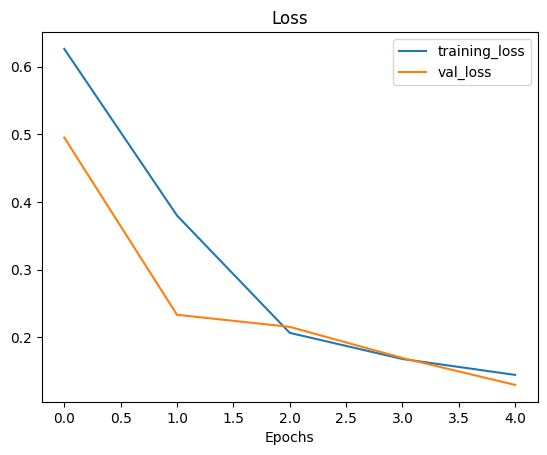

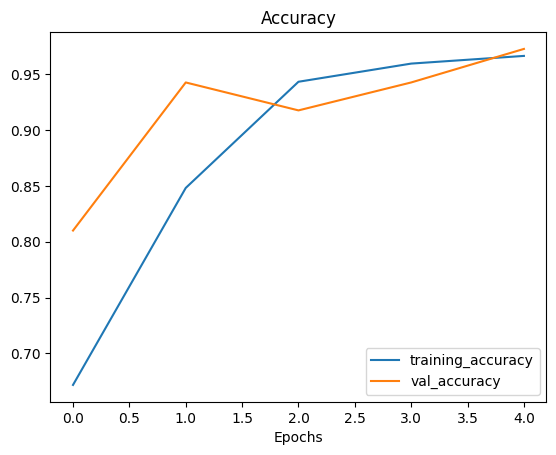

In [ ]:
# Check out the loss curves of model
plot_loss_curves(history)

In [ ]:
# Set random seed
tf.random.set_seed(42)

# Create a model similar to model_1 but add an extra layer and increase the number of hidden units in each layer
model_3 = tf.keras.Sequential([
  tf.keras.layers.Flatten(input_shape=(224, 224, 3)), # dense layers expect a 1-dimensional vector as input
  tf.keras.layers.Dense(100, activation='relu'), # increase number of neurons from 4 to 100 (for each layer)
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(100, activation='relu'), # add an extra layer
  tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model_3.compile(loss='binary_crossentropy',
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

# Fit the model
history_3 = model_3.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
50/50 [==============================] - 6s 81ms/step - loss: 5.9171 - accuracy: 0.5419 - val_loss: 0.6300 - val_accuracy: 0.6850
Epoch 2/5
50/50 [==============================] - 4s 79ms/step - loss: 1.1738 - accuracy: 0.6187 - val_loss: 0.9622 - val_accuracy: 0.6875
Epoch 3/5
50/50 [==============================] - 4s 84ms/step - loss: 0.6959 - accuracy: 0.6781 - val_loss: 0.4713 - val_accuracy: 0.7975
Epoch 4/5
50/50 [==============================] - 3s 66ms/step - loss: 0.5911 - accuracy: 0.7394 - val_loss: 0.8554 - val_accuracy: 0.5175
Epoch 5/5
50/50 [==============================] - 5s 94ms/step - loss: 0.6847 - accuracy: 0.6931 - val_loss: 0.4756 - val_accuracy: 0.7550


In [ ]:
model_3.evaluate(test_data)

13/13 [==============================] - 1s 48ms/step - loss: 0.4756 - accuracy: 0.7550


[0.47555387020111084, 0.7549999952316284]

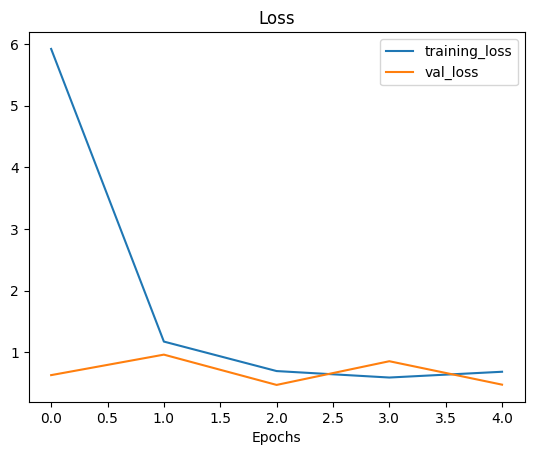

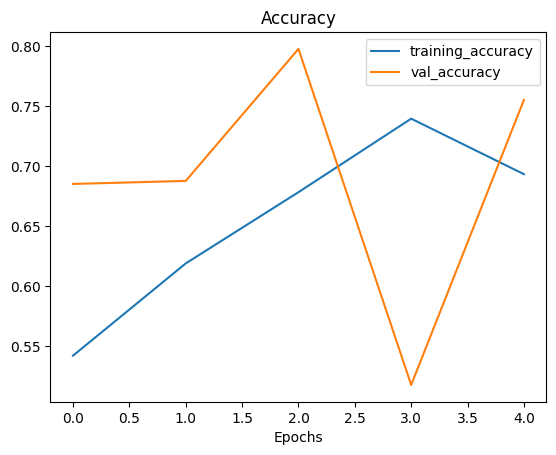

In [ ]:
# Check out the loss curves of model_3
plot_loss_curves(history_3)

## Making a prediction with our trained model

--2024-04-04 09:37:26--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1978213 (1.9M) [image/jpeg]
Saving to: ‘03-steak.jpeg’

03-steak.jpeg       100%[===================>]   1.89M  --.-KB/s    in 0.06s   

2024-04-04 09:37:26 (32.2 MB/s) - ‘03-steak.jpeg’ saved [1978213/1978213]



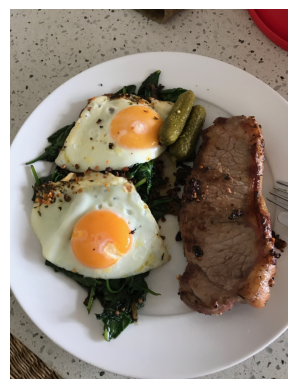

In [ ]:
# View our example image
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
steak = mpimg.imread("03-steak.jpeg")
plt.imshow(steak)
plt.axis(False);

In [ ]:
# Create a function to import an image and resize it to be able to be used with our model
def load_and_prep_image(filename, img_shape=224):
  """
  Reads an image from filename, turns it into a tensor
  and reshapes it to (img_shape, img_shape, colour_channel).
  """
  # Read in target file (an image)
  img = tf.io.read_file(filename)

  # Decode the read file into a tensor & ensure 3 colour channels
  # (our model is trained on images with 3 colour channels and sometimes images have 4 colour channels)
  img = tf.image.decode_image(img, channels=3)

  # Resize the image (to the same size our model was trained on)
  img = tf.image.resize(img, size = [img_shape, img_shape])

  # Rescale the image (get all values between 0 and 1)
  img = img/255.
  return img

In [ ]:
# Load in and preprocess our custom image
steak = load_and_prep_image("03-steak.jpeg")
steak

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.6377451 , 0.6220588 , 0.57892156],
        [0.6504902 , 0.63186276, 0.5897059 ],
        [0.63186276, 0.60833335, 0.5612745 ],
        ...,
        [0.52156866, 0.05098039, 0.09019608],
        [0.49509802, 0.04215686, 0.07058824],
        [0.52843136, 0.07745098, 0.10490196]],

       [[0.6617647 , 0.6460784 , 0.6107843 ],
        [0.6387255 , 0.6230392 , 0.57598037],
        [0.65588236, 0.63235295, 0.5852941 ],
        ...,
        [0.5352941 , 0.06862745, 0.09215686],
        [0.529902  , 0.05931373, 0.09460784],
        [0.5142157 , 0.05539216, 0.08676471]],

       [[0.6519608 , 0.6362745 , 0.5892157 ],
        [0.6392157 , 0.6137255 , 0.56764704],
        [0.65637255, 0.6269608 , 0.5828431 ],
        ...,
        [0.53137255, 0.06470589, 0.08039216],
        [0.527451  , 0.06862745, 0.1       ],
        [0.52254903, 0.05196078, 0.0872549 ]],

       ...,

       [[0.49313724, 0.42745098, 0.31029412],
        [0.05

There's one more problem...

Although our image is in the same shape as the images our model has been trained on, we're still missing a dimension.

Remember how our model was trained in batches?

Well, the batch size becomes the first dimension.

So in reality, our model was trained on data in the shape of `(batch_size, 224, 224, 3)`.

We can fix this by adding an extra to our custom image tensor using [`tf.expand_dims`](https://www.tensorflow.org/api_docs/python/tf/expand_dims).

In [ ]:
# Add an extra axis
print(f"Shape before new dimension: {steak.shape}")
steak = tf.expand_dims(steak, axis=0) # add an extra dimension at axis 0
#steak = steak[tf.newaxis, ...] # alternative to the above, '...' is short for 'every other dimension'
print(f"Shape after new dimension: {steak.shape}")
steak

Shape before new dimension: (224, 224, 3)
Shape after new dimension: (1, 224, 224, 3)


<tf.Tensor: shape=(1, 224, 224, 3), dtype=float32, numpy=
array([[[[0.6377451 , 0.6220588 , 0.57892156],
         [0.6504902 , 0.63186276, 0.5897059 ],
         [0.63186276, 0.60833335, 0.5612745 ],
         ...,
         [0.52156866, 0.05098039, 0.09019608],
         [0.49509802, 0.04215686, 0.07058824],
         [0.52843136, 0.07745098, 0.10490196]],

        [[0.6617647 , 0.6460784 , 0.6107843 ],
         [0.6387255 , 0.6230392 , 0.57598037],
         [0.65588236, 0.63235295, 0.5852941 ],
         ...,
         [0.5352941 , 0.06862745, 0.09215686],
         [0.529902  , 0.05931373, 0.09460784],
         [0.5142157 , 0.05539216, 0.08676471]],

        [[0.6519608 , 0.6362745 , 0.5892157 ],
         [0.6392157 , 0.6137255 , 0.56764704],
         [0.65637255, 0.6269608 , 0.5828431 ],
         ...,
         [0.53137255, 0.06470589, 0.08039216],
         [0.527451  , 0.06862745, 0.1       ],
         [0.52254903, 0.05196078, 0.0872549 ]],

        ...,

        [[0.49313724, 0.42745098, 

Our custom image has a batch size of 1! Let's make a prediction on it.

In [ ]:
# Make a prediction on custom image tensor
pred = model.predict(steak)
pred

1/1 [==============================] - 1s 852ms/step


array([[0.99970573]], dtype=float32)

In [ ]:
def pred_and_plot(model, filename):
    """
    Imports an image located at filename, makes a prediction on it with
    a trained model, and plots the image with the predicted class as the title.
    """
    # Import the target image and preprocess it
    img = load_and_prep_image(filename)

    # Make a prediction
    pred = model.predict(tf.expand_dims(img, axis=0))

    # Get the predicted class
    if pred > 0.5:
        pred_class = "Real"
    else:
        pred_class = "Fake"

    # Plot the image and predicted class
    plt.imshow(img)
    plt.title(f"Prediction: {pred_class}")
    plt.axis(False);


1/1 [==============================] - 0s 22ms/step


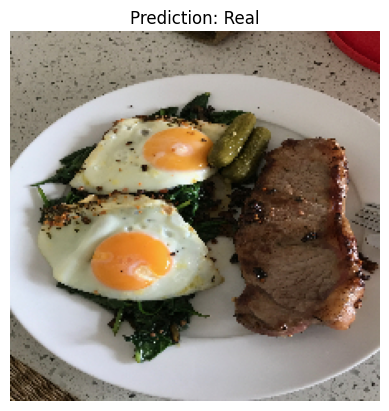

In [ ]:
# Test our model on a custom image
pred_and_plot(model, "03-steak.jpeg")

For predicting an image from image path or url

In [ ]:
import urllib
def load_and_prep_image_from_url(image_url):
    """
    Loads and preprocesses an image from a URL.
    """
    # Load the image from the URL
    response = urllib.request.urlopen(image_url)
    img = Image.open(response)

    # Resize and preprocess the image
    img = img.resize((224, 224))  # Resize to match the input shape expected by the model
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array / 255.0  # Normalize the image

    return img_array

In [ ]:
def pred_and_plot_from_url(model, image_url):
    """
    Imports an image from a URL, makes a prediction on it with
    a trained model, and plots the image with the predicted class as the title.
    """
    # Load and preprocess the image from the URL
    img = load_and_prep_image_from_url(image_url)

    # Make a prediction
    pred = model.predict(tf.expand_dims(img, axis=0))

    # Get the predicted class
    if pred > 0.5:
        pred_class = "Real"
    else:
        pred_class = "Fake"

    # Plot the image and predicted class
    plt.imshow(img)
    plt.title(f"Prediction: {pred_class}")
    plt.axis(False)
    plt.show()

For predicting an image from the Google Drive

In [ ]:
# Function to load and preprocess an image from Google Drive
def load_and_prep_image_from_drive(image_path):
    """
    Loads and preprocesses an image from Google Drive.
    """
    # Load the image
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))

    # Convert image to array and normalize
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array / 255.0  # Normalize the image

    return img_array

def pred_and_plot_from_drive(model, image_path):
    """
    Imports an image from Google Drive, makes a prediction on it with
    a trained model, and plots the image with the predicted class as the title.
    """
    # Load and preprocess the image from Google Drive
    img = load_and_prep_image_from_drive(image_path)

    # Make a prediction
    pred = model.predict(tf.expand_dims(img, axis=0))

    # Get the predicted class
    if pred > 0.5:
        pred_class = "Real"
    else:
        pred_class = "Fake"

    # Plot the image and predicted class
    plt.imshow(img)
    plt.title(f"Prediction: {pred_class}")
    plt.axis(False)
    plt.show()


1/1 [==============================] - 0s 23ms/step


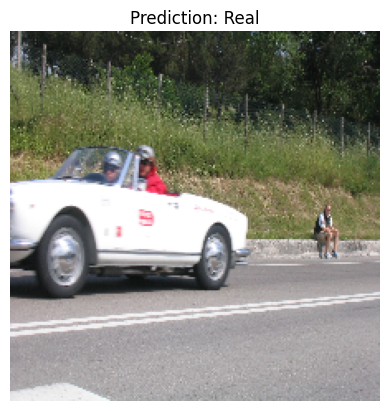

In [ ]:
image_url = '/content/drive/MyDrive/Forgery detection separate /scale/00001_2_scale.jpg'
pred_and_plot_from_drive(model, image_url)

1/1 [==============================] - 0s 40ms/step


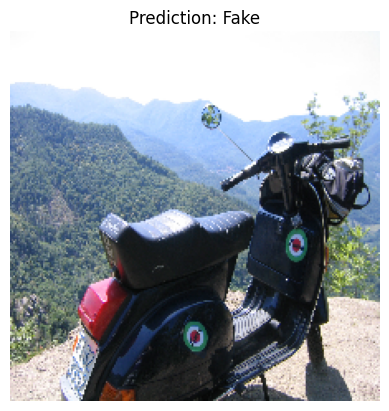

In [ ]:
image_url = '/content/drive/MyDrive/Forgery detection separate /tamp/00007tamp11.jpg'
pred_and_plot_from_drive(model, image_url)

1/1 [==============================] - 0s 22ms/step


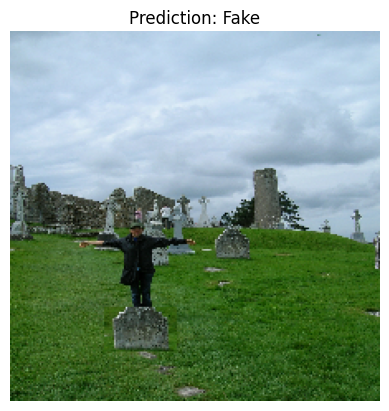

In [ ]:
image_url = '/content/drive/MyDrive/Forgery detection separate /tamp/DSCN47tamp3.jpg'
pred_and_plot_from_drive(model, image_url)

1/1 [==============================] - 0s 20ms/step


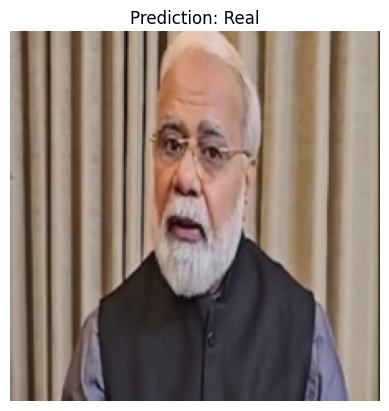

In [ ]:
image_url = 'https://akm-img-a-in.tosshub.com/indiatoday/images/story/202311/pm-narendra-modi-deepfake-doppelganger-clarification-230604944-16x9_0.png?VersionId=VfQBLkUJcxXa3c_CqTMIwMa_oUVi.Tya&size=690:388'
pred_and_plot_from_url(model, image_url)

1/1 [==============================] - 0s 22ms/step


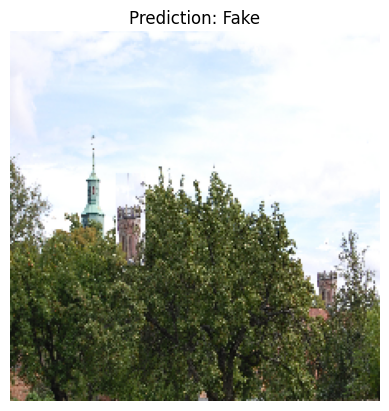

In [ ]:
image_url = '/content/drive/MyDrive/Forgery detection separate /tamp/DSC_0242_01tamp7.jpg'
pred_and_plot_from_drive(model, image_url)